In [1]:
import cv2
import matplotlib.pyplot as plt
import yaml
import numpy as np
import os
import glob
%matplotlib inline

# Calibration

In [2]:
CHECKERBOARD = (7, 4)

subpix_criteria = (cv2.TERM_CRITERIA_EPS+cv2.TERM_CRITERIA_MAX_ITER, 30, 0.1)
calibration_flags = cv2.fisheye.CALIB_RECOMPUTE_EXTRINSIC+cv2.fisheye.CALIB_CHECK_COND+cv2.fisheye.CALIB_FIX_SKEW

objp = np.zeros((1, CHECKERBOARD[0]*CHECKERBOARD[1], 3), np.float32)
objp[0,:,:2] = np.mgrid[0:CHECKERBOARD[0], 0:CHECKERBOARD[1]].T.reshape(-1, 2)
_img_shape = None
objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.

images = glob.glob('imgs/calibration/*.png')

for fname in images:
    img = cv2.imread(fname)
    if _img_shape == None:
        _img_shape = img.shape[:2]
    else:
        assert _img_shape == img.shape[:2], "All images must share the same size."
    
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    # Find the chess board corners
    ret, corners = cv2.findChessboardCorners(gray, CHECKERBOARD, None)
#  , cv2.CALIB_CB_ADAPTIVE_THRESH+cv2.CALIB_CB_FAST_CHECK+cv2.CALIB_CB_NORMALIZE_IMAGE)
    # If found, add object points, image points (after refining them)
    if ret == True:
        objpoints.append(objp)
        cv2.cornerSubPix(gray,corners,(3,3),(-1,-1),subpix_criteria)
        imgpoints.append(corners)

N_OK = len(objpoints)
K = np.zeros((3, 3))
D = np.zeros((4, 1))
rvecs = [np.zeros((1, 1, 3), dtype=np.float64) for i in range(N_OK)]
tvecs = [np.zeros((1, 1, 3), dtype=np.float64) for i in range(N_OK)]
rms, _, _, _, _ = \
    cv2.fisheye.calibrate(
        objpoints,
        imgpoints,
        gray.shape[::-1],
        K,
        D,
        rvecs,
        tvecs,
        calibration_flags,
        (cv2.TERM_CRITERIA_EPS+cv2.TERM_CRITERIA_MAX_ITER, 30, 1e-6)
    )
print("Found " + str(N_OK) + " valid images for calibration")
print("DIM=" + str(_img_shape[::-1]))
print("K=np.array(" + str(K.tolist()) + ")")
print("D=np.array(" + str(D.tolist()) + ")")

Found 21 valid images for calibration
DIM=(1280, 960)
K=np.array([[543.1077783183889, 0.0, 630.7227693413452], [0.0, 540.0320508962757, 486.57499966278846], [0.0, 0.0, 1.0]])
D=np.array([[-0.05195573396247686], [-0.00947747628325948], [0.010893359670474652], [-0.005379311496657442]])


In [3]:
K=np.array([[543.107811968841, 0.0, 630.7227631662455], [0.0, 540.0320855865099, 486.5749791589516], [0.0, 0.0, 1.0]])
D=np.array([[-0.05195582161040964], [-0.009477421485536482], [0.010893416415594874], [-0.005379345567357744]])

# Load image of field

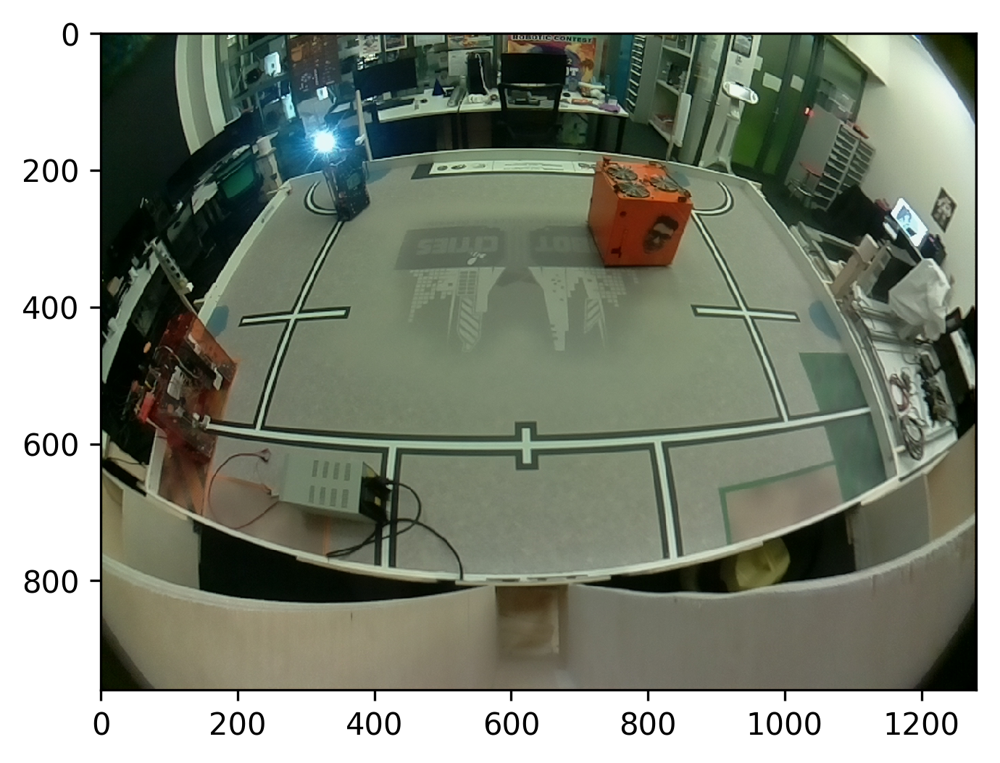

In [19]:
img = cv2.imread("imgs/img_with_diod2.png")
fig, ax = plt.subplots(1, 1, figsize=(6, 4), dpi=300)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_RGB2BGR))

# Calculation of a new field camera matrix

In [20]:
def eulerAnglesToRotationMatrix(theta):
    R_x = np.array([[1, 0, 0], [0, np.cos(theta[0]), -np.sin(theta[0])],
                    [0, np.sin(theta[0]),
                     np.cos(theta[0])]])
    R_y = np.array([[np.cos(theta[1]), 0,
                     np.sin(theta[1])], [0, 1, 0],
                    [-np.sin(theta[1]), 0,
                     np.cos(theta[1])]])
    R_z = np.array([[np.cos(theta[2]), -np.sin(theta[2]), 0],
                    [np.sin(theta[2]), np.cos(theta[2]), 0], [0, 0, 1]])
    R = np.dot(R_z, np.dot(R_y, R_x))
    return R

rotation_matrix = eulerAnglesToRotationMatrix((3 * np.pi / 4 + 0.2, 0, 0))
camera_position = np.array([[1500, 0, 1000]]).T
t = -rotation_matrix.dot(camera_position)
M = np.concatenate((rotation_matrix, t), axis=1)
L = np.array([[2.34, 0, 0], [0, -2.08, 2000], [0, 0, 0], [0, 0, 1]])
K_new = np.linalg.inv(M.dot(L)) * 10 ** 3

# Undistortion and remaping

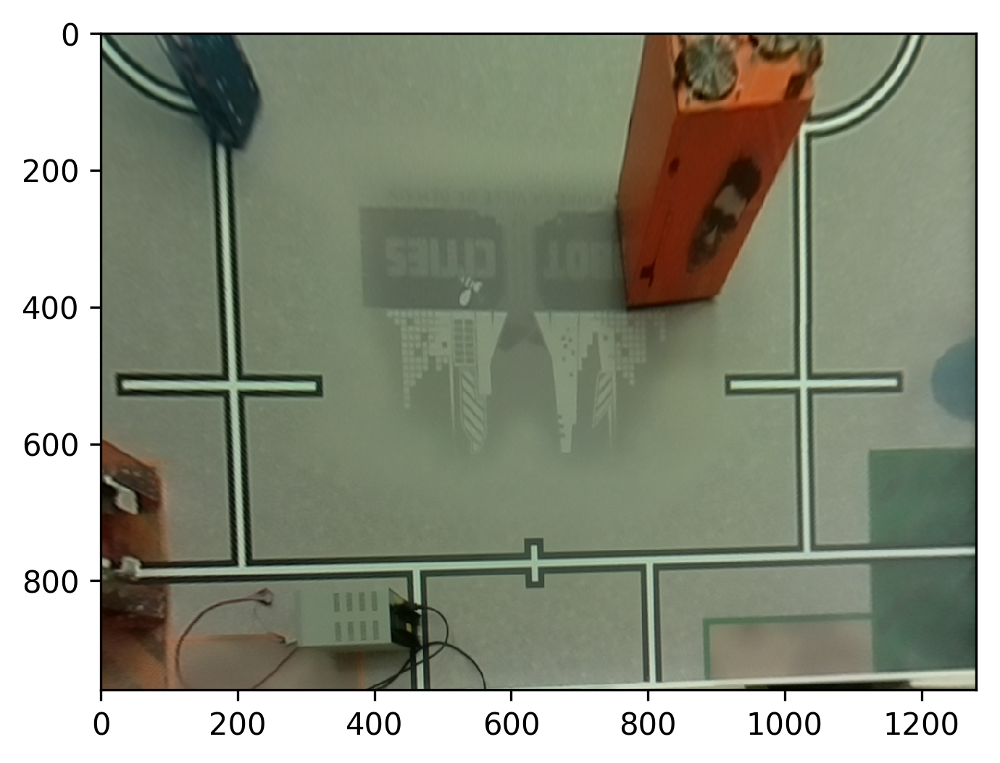

In [21]:
field_img = cv2.fisheye.undistortImage(img, K, D, Knew = K_new)
fig, ax = plt.subplots(1, 1, figsize=(6, 4), dpi=300)
plt.imshow(cv2.cvtColor(field_img, cv2.COLOR_RGB2BGR))

# Load the true field

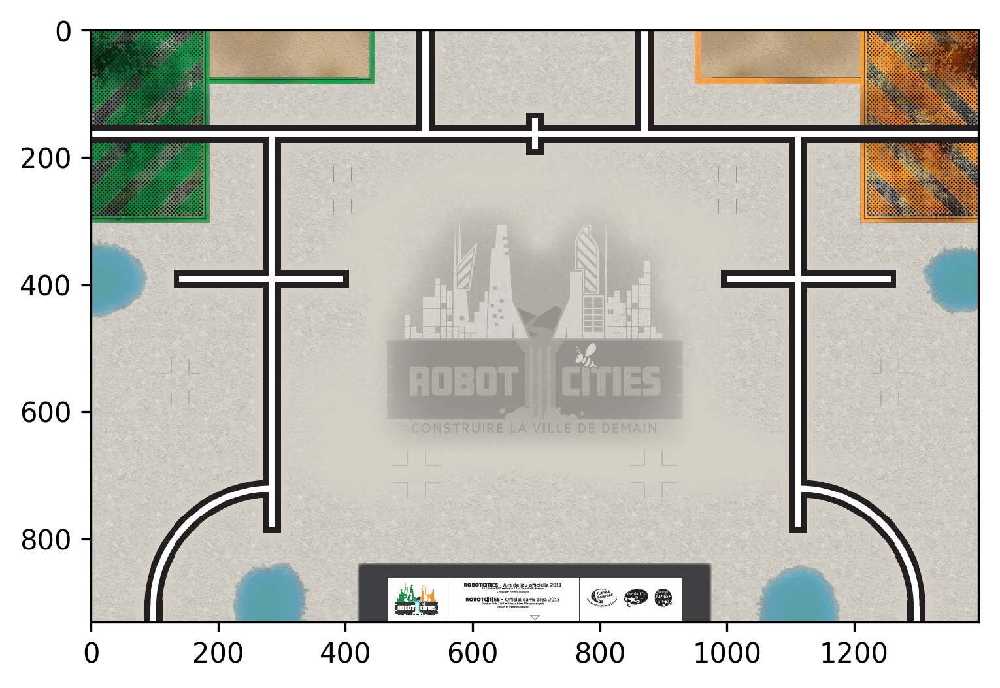

In [7]:
true_img_row = cv2.imread("imgs/Field.png")
fig, ax = plt.subplots(1, 1, figsize=(6, 4), dpi=300)
plt.imshow(cv2.cvtColor(true_img_row, cv2.COLOR_RGB2BGR))

## True field image transformation

In [8]:
rows, cols, ch = img.shape
rows1, cols1, ch = true_img_row.shape

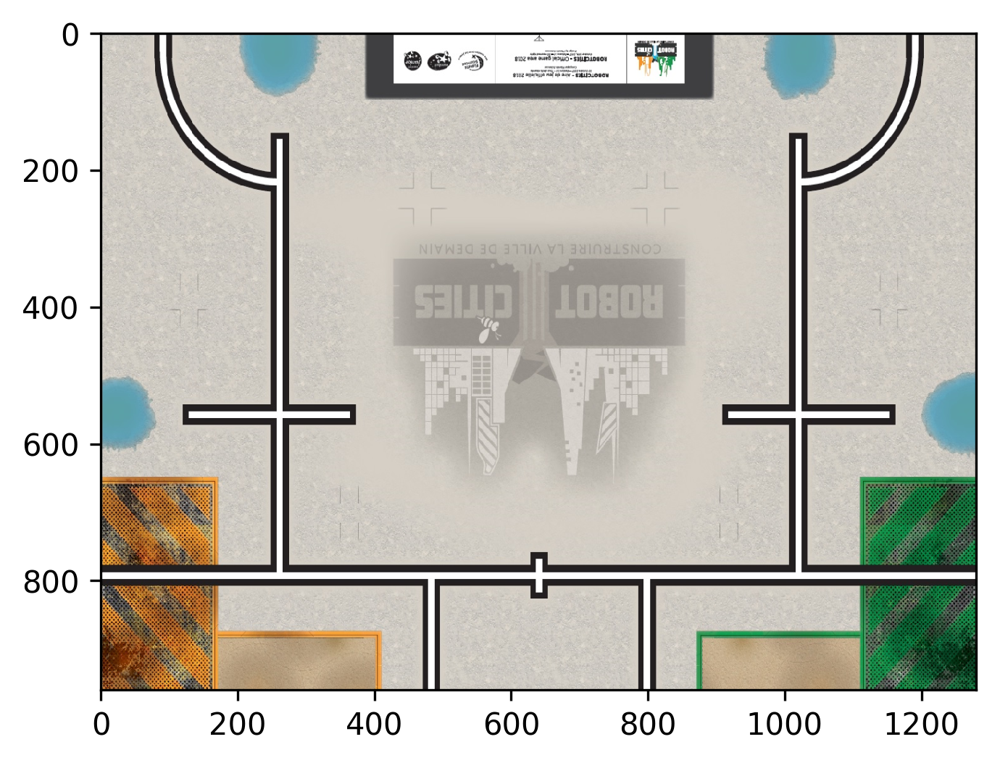

In [9]:
rows,cols,ch = img.shape

pts1 = np.float32([[0, 0],[0, rows1],[cols1, 0]])
pts2 = np.float32([[cols, rows],[cols, 0],[0, rows]])

M_t = cv2.getAffineTransform(pts1,pts2)

true_img = cv2.warpAffine(true_img_row,M_t,(cols,rows))
fig, ax = plt.subplots(1, 1, figsize=(6, 4), dpi=300)
plt.imshow(cv2.cvtColor(true_img, cv2.COLOR_RGB2BGR))

# Feature detection

## ORB on the real field

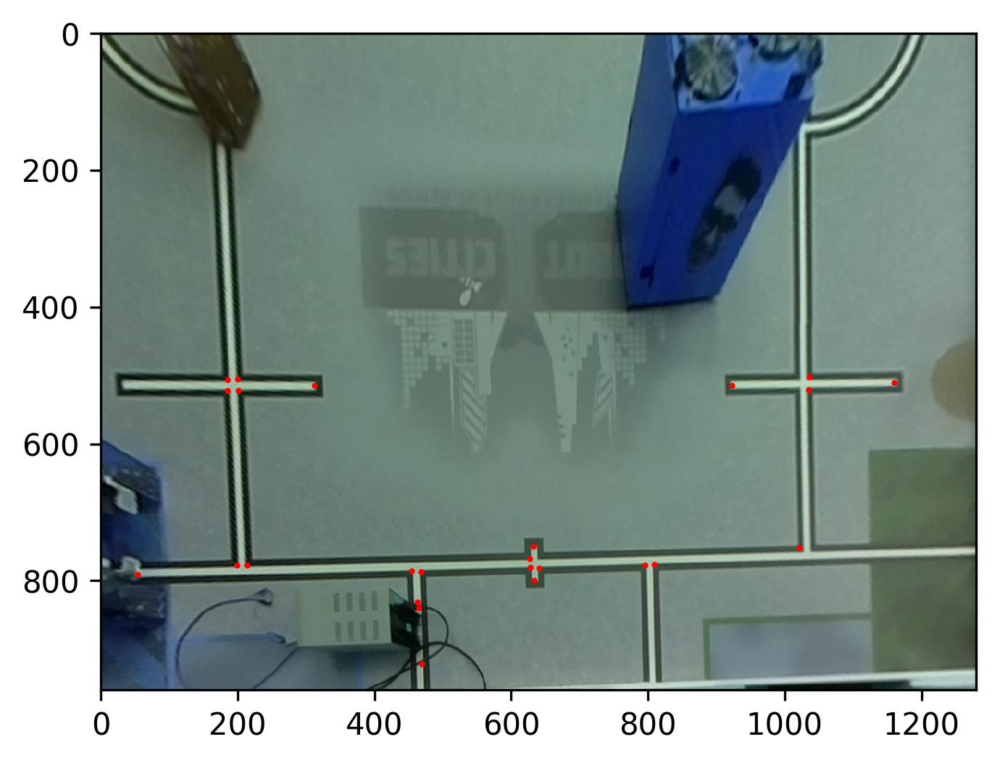

In [22]:
gray = cv2.cvtColor(field_img, cv2.COLOR_RGB2GRAY)
hist = cv2.equalizeHist(gray)

orb = cv2.ORB_create(100, WTA_K=3)

kp = orb.detect(hist, None)

kp_h = np.array([x_.pt for x_ in kp])
diff_matrix = np.sum((kp_h[:, np.newaxis] - kp_h[np.newaxis, :]) ** 2, axis=2) ** 0.5
indx = [0]
summ = [kp_h[0]]
cont = [1]
for i in range(1, len(kp)):

    v = np.min(diff_matrix[i, indx])
    if v < 12:
        j = np.argmin(diff_matrix[i, indx])
        summ[j] += kp_h[i]
        cont[j] += 1
    else:
        indx.append(i)
        summ.append(kp_h[i])
        cont.append(1)
kp1_h = np.array([summ[i] / cont[i] for i in range(len(indx))])
# kp1_h = kp_h

fig, ax = plt.subplots(1, 1, figsize=(6, 4), dpi=300)
plt.imshow(field_img)
plt.scatter(*(kp1_h.T), c='r', s=1)
plt.show()

## ORB on true img

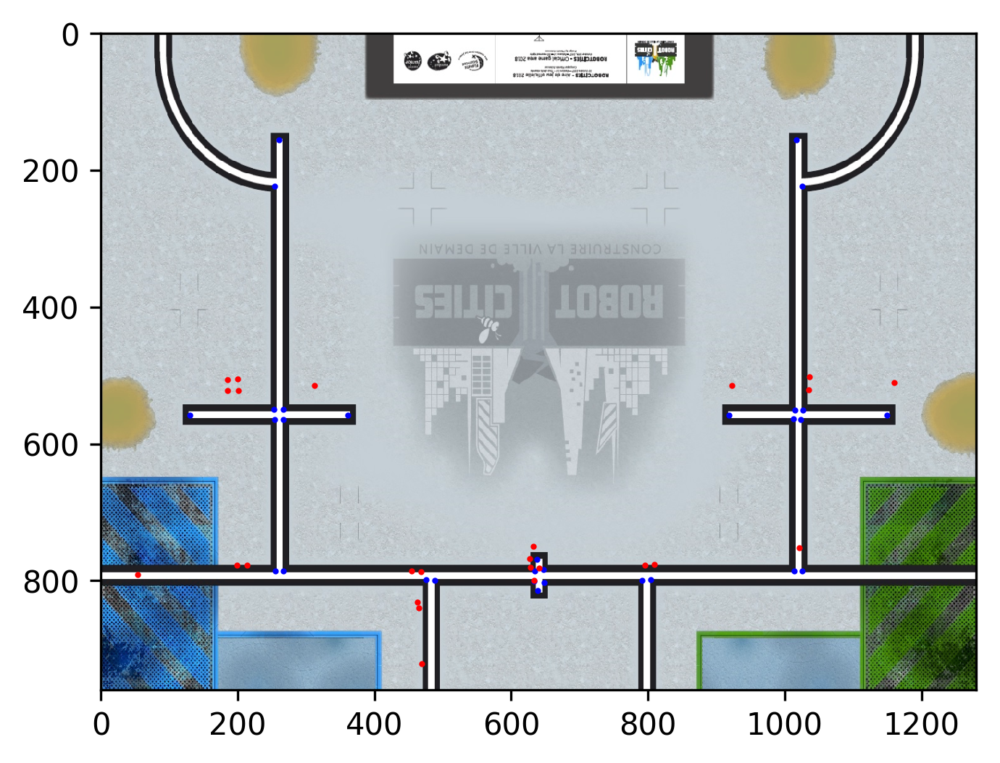

In [23]:
gray = cv2.cvtColor(true_img, cv2.COLOR_RGB2GRAY)
hist = cv2.equalizeHist(gray)

orb = cv2.ORB_create(100, WTA_K=3)

kp = orb.detect(hist, None)

kp_h = np.array([x_.pt for x_ in kp])
diff_matrix = np.sum((kp_h[:, np.newaxis] - kp_h[np.newaxis, :]) ** 2, axis=2) ** 0.5
indx = [0]
summ = [kp_h[0]]
cont = [1]
for i in range(1, len(kp)):

    v = np.min(diff_matrix[i, indx])
    if v < 11:
        j = np.argmin(diff_matrix[i, indx])
        summ[j] += kp_h[i]
        cont[j] += 1
    else:
        indx.append(i)
        summ.append(kp_h[i])
        cont.append(1)
kp2_h = np.array([summ[i] / cont[i] for i in range(len(indx))])
kp2_h = np.array([k for k in kp2_h if k[1] > 100])

fig, ax = plt.subplots(1, 1, figsize=(6, 4), dpi=300)
plt.imshow(true_img)
plt.scatter(*(kp2_h.T), c='b', s=1)
plt.scatter(*(kp1_h.T), c='r', s=1)
plt.show()

# Distance match

In [24]:
import pulp
import itertools

n1 = kp1_h.shape[0]
n2 = kp2_h.shape[0]
costs = np.sum((kp1_h[:, np.newaxis] - kp2_h[np.newaxis, :]) ** 2, axis=2) ** 0.5

prob = pulp.LpProblem("eurobot")
x = pulp.LpVariable.dicts("x", [(i, j) for (i, j) in itertools.product(
    range(n1), range(n2))], 0, 1, pulp.LpBinary)
y = pulp.LpVariable.dicts("y", [i for i in range(n1)], 0, 1, pulp.LpBinary)
z = pulp.LpVariable.dicts("z", [j for j in range(n2)], 0, 1, pulp.LpBinary)

prob += pulp.lpSum((costs[s1, s2] * x[(s1, s2)]) for s1, s2 in itertools.product(range(n1), range(n2))
                  ) - pulp.lpSum([70 * y[i] for i in range(n1)]) - pulp.lpSum([70 * z[j] for j in range(n2)])

for s in range(n1):
    prob += pulp.lpSum([x[(s, i)] for i in range(n2)]) == y[s]
for s in range(n2):
    prob += pulp.lpSum([x[(i, s)] for i in range(n1)]) == z[s]

In [25]:
prob.solve()
        
ind1, ind2 = [], []
for i, j in itertools.product(range(n1), range(n2)):
    if x[(i, j)].varValue >= 1:
        ind1.append(i)
        ind2.append(j)

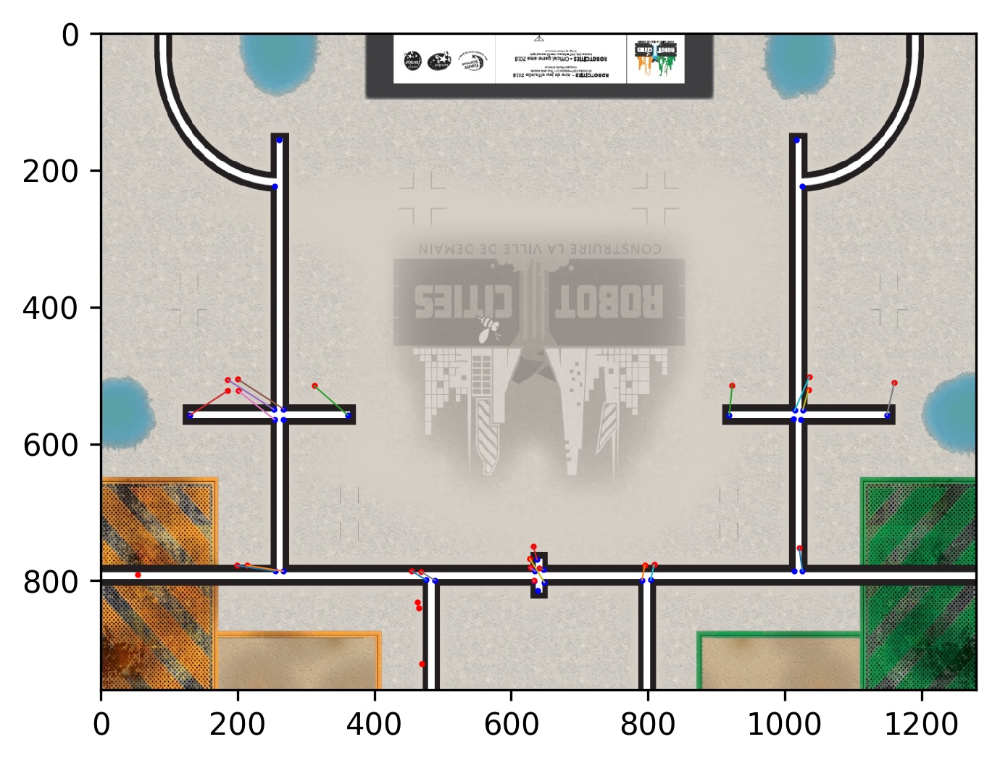

In [26]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4), dpi=300)
ax.imshow(cv2.cvtColor(true_img, cv2.COLOR_RGB2BGR))
ax.plot(*np.vstack((kp1_h[ind1].flatten(), kp2_h[ind2].flatten())).T, linewidth=0.5)
plt.scatter(*(kp2_h.T), c='b', s=1)
plt.scatter(*(kp1_h.T), c='r', s=1)
plt.show()

# Find Homography

In [27]:
res = cv2.findHomography(kp1_h[ind1], kp2_h[ind2], method=cv2.RHO)
Tr = res[0]
Tr

array([[  7.72128582e-01,  -4.89107631e-02,   1.25099533e+02],
       [ -5.58640771e-02,   7.94615984e-01,   1.35127960e+02],
       [ -9.73771967e-05,  -4.64651494e-05,   1.00000000e+00]])

In [28]:
K_opt = Tr.dot(K_new)

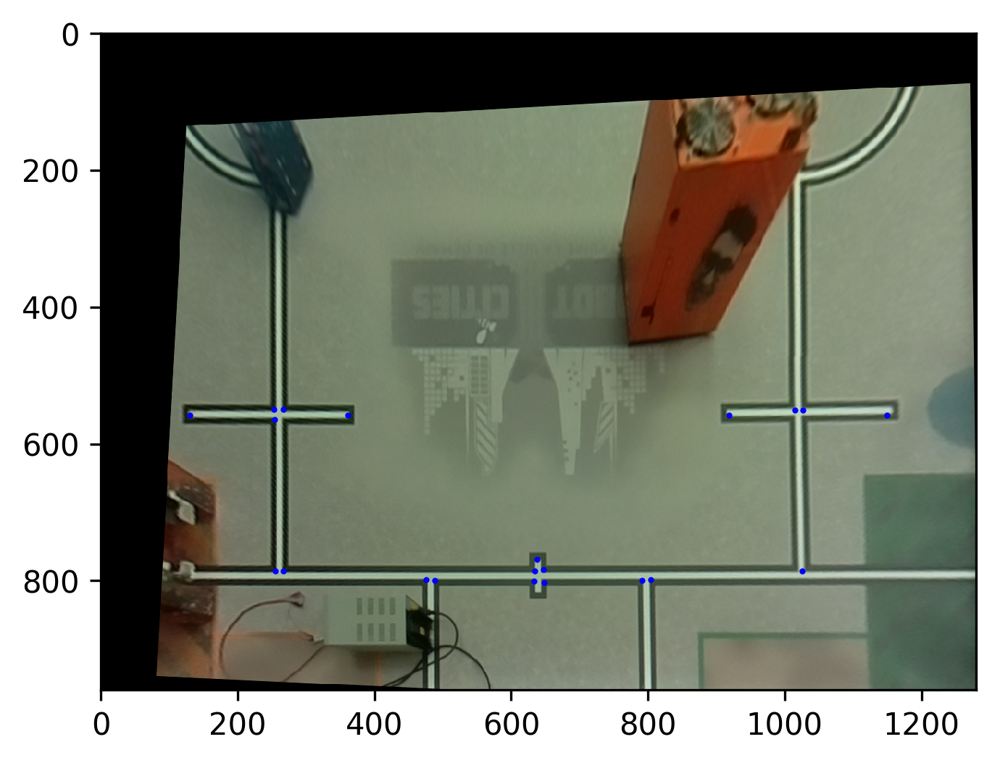

In [29]:
dst = cv2.warpPerspective(field_img, Tr,(cols,rows))
fig, ax = plt.subplots(1, 1, figsize=(6, 4), dpi=300)
plt.scatter(*(kp2_h[ind2].T), c='b', s=1)
ax.imshow(cv2.cvtColor(dst, cv2.COLOR_RGB2BGR))

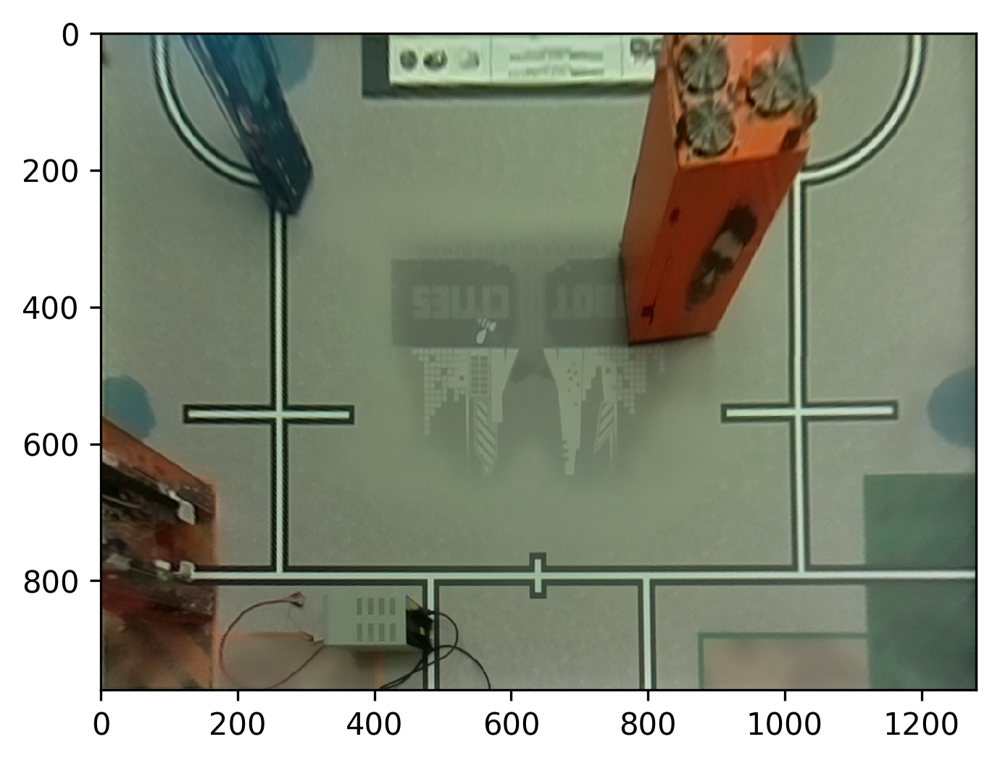

In [30]:
field_img = cv2.fisheye.undistortImage(img, K, D, Knew = K_opt)
fig, ax = plt.subplots(1, 1, figsize=(6, 4), dpi=300)
plt.imshow(cv2.cvtColor(field_img, cv2.COLOR_RGB2BGR))

# Test function on different images

In [19]:
from TrackingCamera import *

eurobot:
MINIMIZE
None
VARIABLES

[[ 7.85866618e-01 -2.58831531e-02  1.17236794e+02]
 [-7.19218180e-02  8.58451009e-01  1.19876259e+02]
 [-1.20161829e-04  1.06447787e-05  1.00000000e+00]]


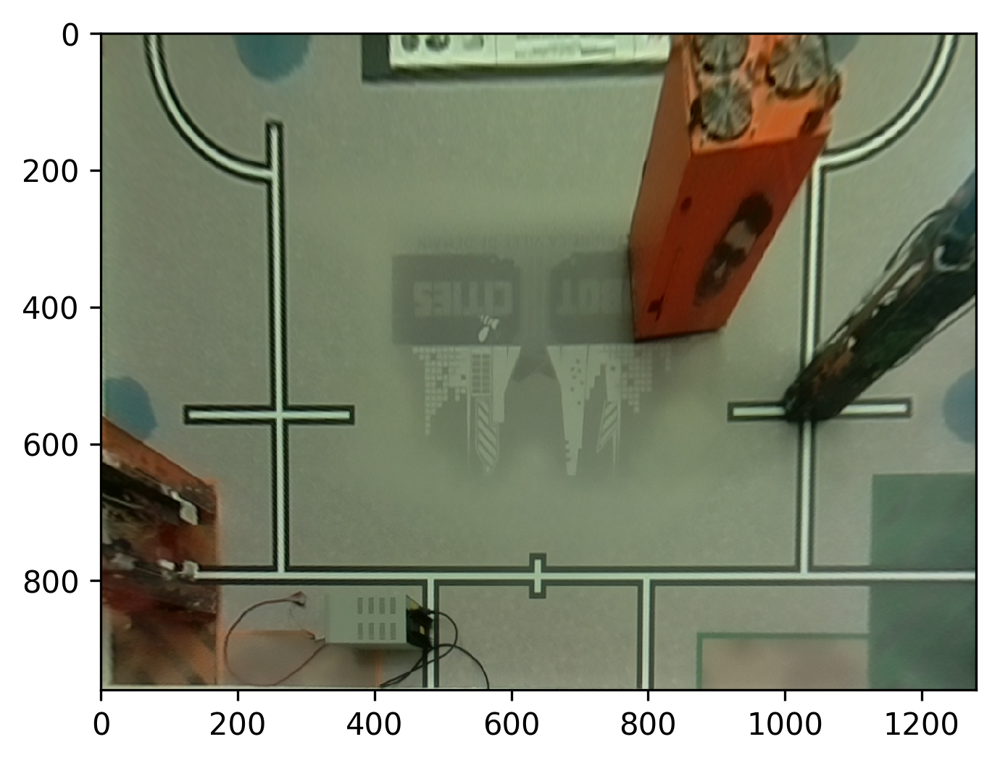

In [25]:
img = cv2.imread("imgs/img_with_diod5.png")
T = find_true_calibration(img, K, D, M, L, kp2_h)
print(T)
K_opt = T.dot(np.linalg.inv(M.dot(L)) * 10 ** 3)
new_img = cv2.fisheye.undistortImage(img, K, D, Knew = K_opt)

fig, ax = plt.subplots(1, 1, figsize=(6, 4), dpi=300)
plt.imshow(cv2.cvtColor(new_img, cv2.COLOR_RGB2BGR))